In [1]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.layers import Dense, InputLayer, Dropout, Conv2D, MaxPooling2D, Flatten, GlobalAveragePooling2D
from keras.callbacks import EarlyStopping as ES
from IPython.display import clear_output as cls


import plotly.express as px
import matplotlib.pyplot as plt

In [2]:
batchSize = 32
imageShape = (224, 224)
epochs = 10
channels = 32

In [11]:
train_dir = "C://Users//ANKITA//Downloads//archive (5)//tomato//val//"
val_dir = "C://Users//ANKITA//Downloads//archive (5)//tomato//train//"

In [12]:
class_names = sorted(os.listdir(train_dir))
class_names

['Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',
 'Tomato___Tomato_mosaic_virus',
 'Tomato___healthy']

In [13]:
class_dis = [len(os.listdir(train_dir + name)) for name in class_names]
class_dis

[100, 100, 100, 100, 100, 100, 100, 100, 100, 100]

In [14]:
fig = px.pie(names=class_names, values=class_dis, hole=0.3)
fig.update_layout({"title":{"text":"Distibution of classes", "x":0.50}})
fig.show()

In [15]:
train_gen = ImageDataGenerator(rescale=(1./255.), validation_split=0.2)
val_gen = ImageDataGenerator(rescale=(1./255.))

In [16]:
train_ds = train_gen.flow_from_directory(train_dir,target_size=imageShape,batch_size=batchSize, subset='training', class_mode='categorical')
val_ds = train_gen.flow_from_directory(train_dir,target_size=imageShape,batch_size=batchSize, subset='validation', class_mode='categorical')

Found 800 images belonging to 10 classes.
Found 200 images belonging to 10 classes.


In [17]:
test_ds = val_gen.flow_from_directory(val_dir,target_size=imageShape,batch_size=batchSize, class_mode='categorical')

Found 10000 images belonging to 10 classes.


In [18]:
def plot_images(data, class_names):
    
    r, c = 3, 4
    imgLen = r*c
    
    plt.figure(figsize=(20, 15))
    i = 1
    
    for images, labels in iter(data):
        
        
        id = np.random.randint(len(images))
#         img = images[id].numpy().astype('uint8')
        img = tf.expand_dims(images[id], axis=0)
        lab = class_names[np.argmax(labels[id])]
        
        plt.subplot(r, c, i)
        plt.imshow(img[0])
        plt.title(lab)
        plt.axis('off')
        cls()
        
        i+=1
        if i > imgLen:
            break
    plt.show()

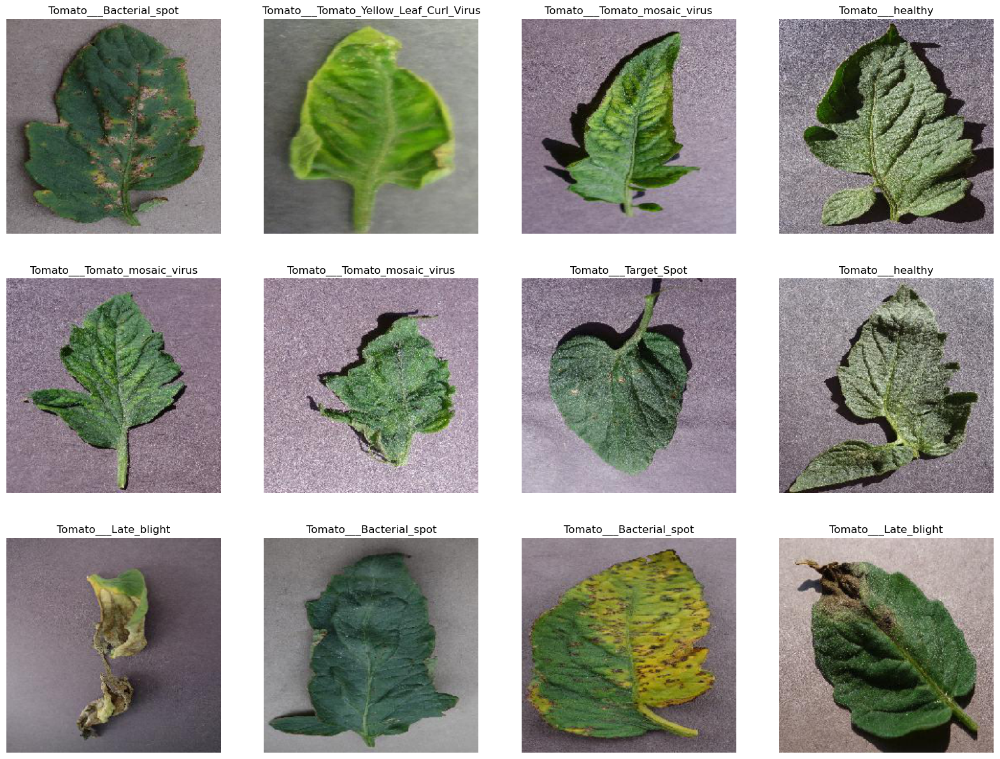

In [19]:
plot_images(train_ds, class_names)

In [20]:
def get_model():
    
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    
    for layers in base_model.layers:
        layers.trainable = False
        
    base_model_output = base_model.output
    
    x = Flatten()(base_model_output)
    x = Dense(512, activation='relu')(x)
    x = Dense(len(class_names), activation='softmax')(x)
    
    model = Model(inputs=base_model.input, outputs=x)
    return model

In [21]:
model = get_model()

model.compile(loss="categorical_crossentropy",
             optimizer="sgd",
             metrics=["accuracy"])

model.summary()

87916544/87910968 [==============================] - 391s 4us/step
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 111, 111, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           batch_normalization[0][0]        
____________________

In [22]:
history = model.fit(train_ds,
                   validation_data=val_ds,
                   epochs=10,
                   steps_per_epoch=len(train_ds),
                   validation_steps=len(val_ds),
                   callbacks=[ES(monitor="val_loss", patience=5)])

Epoch 1/10
25/25 [==============================] - 62s 2s/step - loss: 5.9989 - accuracy: 0.1737 - val_loss: 2.0734 - val_accuracy: 0.2400
Epoch 2/10
25/25 [==============================] - 57s 2s/step - loss: 1.7908 - accuracy: 0.3887 - val_loss: 2.2267 - val_accuracy: 0.3000
Epoch 3/10
25/25 [==============================] - 56s 2s/step - loss: 1.3529 - accuracy: 0.5375 - val_loss: 2.2888 - val_accuracy: 0.2950
Epoch 4/10
25/25 [==============================] - 57s 2s/step - loss: 0.9989 - accuracy: 0.6750 - val_loss: 1.3361 - val_accuracy: 0.5550
Epoch 5/10
25/25 [==============================] - 57s 2s/step - loss: 0.7287 - accuracy: 0.7650 - val_loss: 1.2143 - val_accuracy: 0.5850
Epoch 6/10
25/25 [==============================] - 57s 2s/step - loss: 0.3814 - accuracy: 0.8825 - val_loss: 1.0833 - val_accuracy: 0.6550
Epoch 7/10
25/25 [==============================] - 57s 2s/step - loss: 0.4928 - accuracy: 0.8575 - val_loss: 1.1813 - val_accuracy: 0.6200
Epoch 8/10
25/25 [==

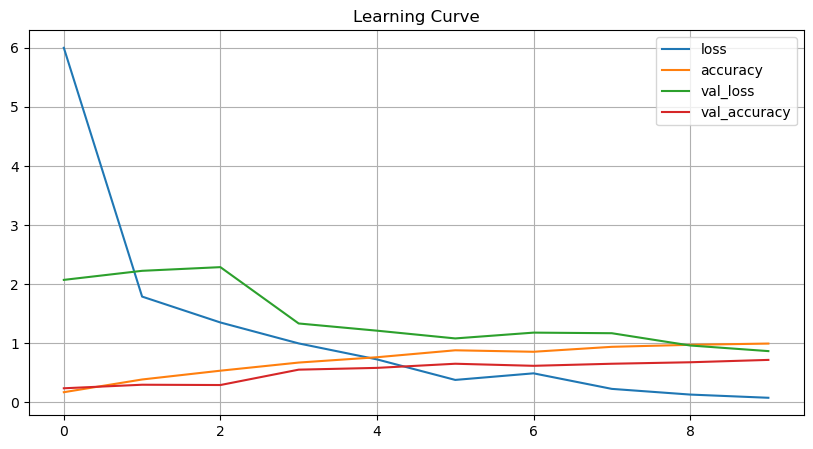

In [23]:
learningcurve = pd.DataFrame(history.history)
learningcurve.plot(figsize=(10, 5))
plt.title("Learning Curve")
plt.grid()

In [24]:
def predictImages(data, class_names, model):
    
    r, c = 3, 4
    imgLen = r*c
    plt.figure(figsize=(20, 15))
    i = 1
    
    for images, labels in iter(data):
        
        id = np.random.randint(len(images))
        img = tf.expand_dims(images[id], axis=0)
        
        plt.subplot(r, c, i)
        plt.imshow(img[0])
        
        predicted = model.predict(img)
        predicted = class_names[np.argmax(predicted)]
        actual = class_names[np.argmax(labels[id])]
        
        plt.title(f"Actual: {actual}\nPredicted: {predicted}")
        plt.axis('off')
        cls()
        
        i+=1
        if i > imgLen:
            break
            
    plt.show()
        

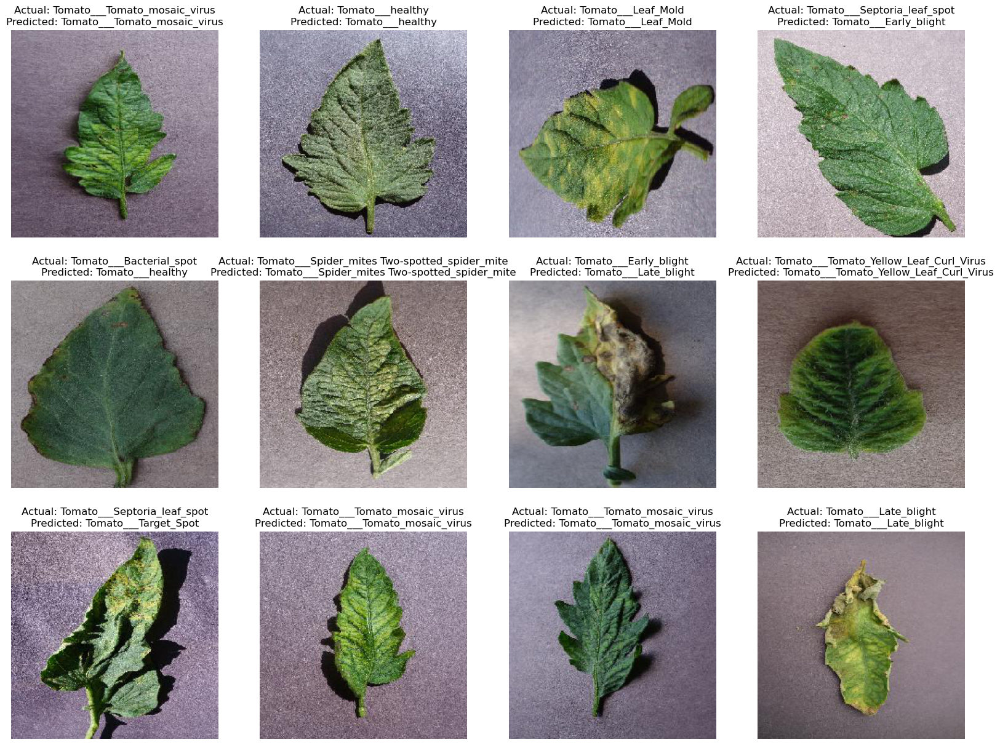

In [25]:
predictImages(test_ds, class_names, model)